# Diagnostics

In this notebook, we are going to look at some simulations that we have available and analyze some of the statistical properties of the datasets. 

In [1]:
import sys, os
from pyprojroot import here

# spyder up to find the root
root = here(project_files=[".here"])

# append to path
sys.path.append(str(root))

In [2]:
import sys
import math

import torch
import torch.nn as nn

import numpy as np
import matplotlib
import matplotlib.pyplot as plt

import xarray as xr
import hvplot.xarray
import powerspec as ps
import xrft
from dask.diagnostics import ProgressBar

from torchqg import to_spectral, to_physical, QgModel, MLdiv, Constant
from torchqg.src.constants import t_unit, l_unit
import tqdm

from shapely.errors import ShapelyDeprecationWarning
from xmovie import Movie

import warnings
warnings.filterwarnings(
    action='ignore',
    category=ShapelyDeprecationWarning,  # in cartopy
)
warnings.filterwarnings(
    action="ignore",
    category=UserWarning,
    message=r"No `(vmin|vmax)` provided. Data limits are calculated from input. Depending on the input this can take long. Pass `\1` to avoid this step"
)

%load_ext autoreload
%autoreload 2
%matplotlib inline

device = cpu


In [20]:
data_path = str(root.joinpath("data"))

In [38]:
data_path

'/Users/eman/code_projects/torchqg/data'

In [37]:
!ls $data_path

cutout_res.nc             qgsim_simple_128x128.nc   qgsim_simple_512x512.nc
full_res.nc               qgsim_simple_128x128.zarr qgsim_simple_512x512.zarr
hi_res.nc                 qgsim_simple_256x256.nc
qg_sim_simple.nc          qgsim_simple_256x256.zarr


In [30]:
# !ls /mnt/meom/workdir/johnsonj/data

data_name = root.joinpath("data/qgsim_simple_512x512.zarr")
save_path = root.joinpath("data/qgsim_simple_512x512.nc")
# save_path = root.joinpath("temp.nc")

In [31]:
ds_grid = xr.open_zarr(data_name)
ds_grid

,Array,Chunk
Bytes,1.95 GiB,1.97 MiB
Shape,"(1000, 512, 512)","(63, 64, 64)"
Count,1025 Tasks,1024 Chunks
Type,float64,numpy.ndarray
,Array,Chunk
Bytes,1.95 GiB,1.97 MiB
Shape,"(1000, 512, 512)","(63, 64, 64)"
Count,1025 Tasks,1024 Chunks
Type,float64,numpy.ndarray
,Array,Chunk


In [347]:
# ds_grid.p.hvplot.image(x="Nx", y="Ny", width=500, height=400, cmap="viridis")

In [348]:
# spatial domain conversion, meters (m)
space_distance: float = 5040e3    # 5,040 km
space_unit: float = space_distance / math.pi  
# time domain conversion, seconds (s)
time_unit: float = 1.2e6         # 
dt: float = 480. / time_unit 
# velocity units, meters / second (m/s)
vel_unit: float = space_unit / time_unit

In [349]:
ds_grid.coords["Nx"] = ds_grid.coords["Nx"] * l_unit()
ds_grid.coords["Ny"] = ds_grid.coords["Ny"] * l_unit()
          # unitless
ds_grid.coords["steps"] = ds_grid.coords["steps"] * t_unit() * dt
ds_grid["u"] *= vel_unit
ds_grid["v"] *= vel_unit
ds_grid["p"] *= space_unit**2 / time_unit
ds_grid["q"] *= (space_unit/space_unit)/time_unit
ds_grid

,Array,Chunk
Bytes,1.95 GiB,1.97 MiB
Shape,"(1000, 512, 512)","(63, 64, 64)"
Count,2049 Tasks,1024 Chunks
Type,float64,numpy.ndarray
,Array,Chunk
Bytes,1.95 GiB,1.97 MiB
Shape,"(1000, 512, 512)","(63, 64, 64)"
Count,2049 Tasks,1024 Chunks
Type,float64,numpy.ndarray
,Array,Chunk


### Preprocessing

* Slice time steps (due to the simulation warmup period)
* Rescale/Reformat time
* Add a dummy observation dataset (+ Gaussian noise)

In [32]:
def reformat_time(ds, dt):
    
    ds = ds - ds[0]
    ds /= dt
    
    return ds


def preprocessing(ds, noise: float=0.01, dt: float=1.0):
    
    # slice timesteps
    ds = ds.isel(steps=slice(500,511))
    
    # reformat time
    time_coords = ds.steps.values.astype(np.float64)

    time_coords = reformat_time(
        time_coords, dt
    )
    time_coords = time_coords.astype(np.float64)
    ds["steps"] = time_coords
    
    # add noise to observations
    rng = np.random.RandomState(123)

    ds["q_obs"] = ds["q"] + noise * rng.randn(*ds["q"].shape)
    ds["p_obs"] = ds["p"] + noise * rng.randn(*ds["p"].shape)
    
    return ds

In [33]:
%%time

ds_grid = preprocessing(ds_grid)

CPU times: user 142 ms, sys: 7.72 ms, total: 150 ms
Wall time: 151 ms


In [34]:
ds_grid

<xarray.Dataset>
Dimensions:  (Nx: 512, Ny: 512, steps: 11)
Coordinates:
  * Nx       (Nx) float64 -3.142 -3.129 -3.117 -3.105 ... 3.105 3.117 3.129
  * Ny       (Ny) float64 -3.142 -3.129 -3.117 -3.105 ... 3.105 3.117 3.129
  * steps    (steps) float64 0.0 1.0 2.0 3.0 4.0 5.0 6.0 7.0 8.0 9.0 10.0
Data variables:
    p        (steps, Nx, Ny) float64 dask.array<chunksize=(4, 64, 64), meta=np.ndarray>
    q        (steps, Nx, Ny) float64 dask.array<chunksize=(4, 64, 64), meta=np.ndarray>
    u        (steps, Nx, Ny) float64 dask.array<chunksize=(4, 64, 64), meta=np.ndarray>
    v        (steps, Nx, Ny) float64 dask.array<chunksize=(4, 64, 64), meta=np.ndarray>
    q_obs    (steps, Nx, Ny) float64 dask.array<chunksize=(4, 64, 64), meta=np.ndarray>
    p_obs    (steps, Nx, Ny) float64 dask.array<chunksize=(4, 64, 64), meta=np.ndarray>
Attributes: (12/16)
    B:          0.0
    dt:         0.0004
    forcing:    wind_stress
    iters:      10000
    mu:         0.0
    nu:         0.0
    ...         ...
    sgs:        constant
    step_size:  0.01227184630308513
    steps:      1000
    t0:         0.0
    x_minmax:   6.283185307179586
    y_minmax:   6.283185307179586

In [36]:
ds_grid.to_netcdf(save_path)

In [17]:
ds_grid.p.hvplot.image(x="Nx", y="Ny", width=500, height=400, cmap="viridis")

:DynamicMap   [steps]
   :Image   [Nx,Ny]   (p)

In [114]:
# ds_grid.to_netcdf(root.joinpath("data/qg_sim_simple.nc"))

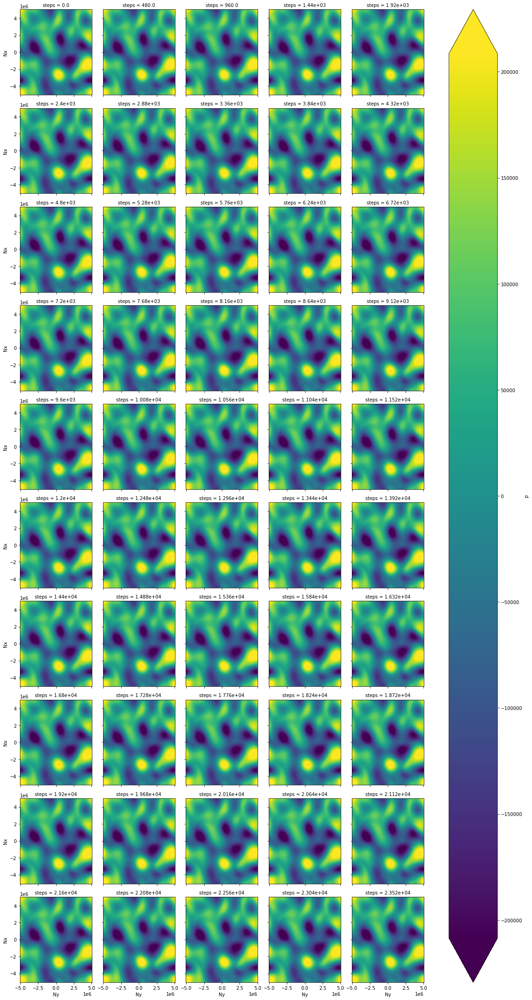

In [353]:
ds_grid.p.thin(steps=1).plot.imshow(
    col="steps", robust=True, col_wrap=5, cmap="viridis",
)


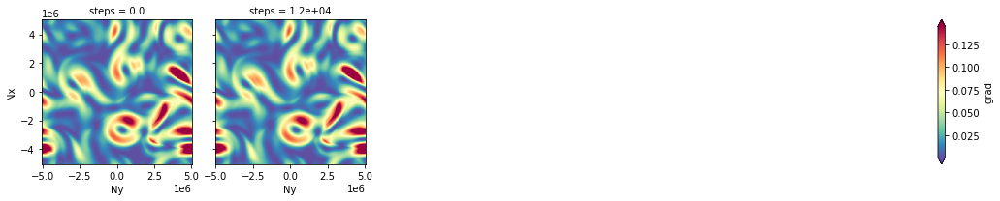

In [354]:
def gradient_norm(ds):
    return (
        ds.differentiate(coord="Nx", edge_order=1)**2 + 
        ds.differentiate(coord="Ny", edge_order=1)**2
    ).rename("grad")

ds_grid.p.pipe(gradient_norm).thin(steps=25).plot.imshow(
    col="steps", robust=True, col_wrap=5, cmap="Spectral_r",
)


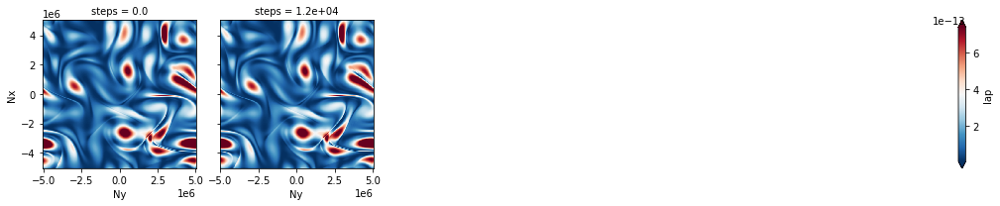

In [355]:
def laplacian_norm(ds):
    return (
        ds.differentiate(coord="Nx", edge_order=1).differentiate(coord="Nx", edge_order=1)**2 + 
        ds.differentiate(coord="Ny", edge_order=1).differentiate(coord="Ny", edge_order=1)**2
    ).rename("lap")

ds_grid.p.pipe(laplacian_norm).thin(steps=25).plot.imshow(
    col="steps", robust=True, col_wrap=5, cmap="RdBu_r"
)


In [116]:
# ds_grid.p_obs.hvplot.image(x="Nx", y="Ny", width=500, height=400, cmap="RdBu_r")

### PSD

In [117]:
def compute_psd(
    ds_truth,
    ds_preds,
    coords,
):
    Nx, Ny, Nz = coords[0], coords[1], coords[2]
    
    with ProgressBar():
        # compute error = SSH recon - SSH gt
        diff = ds_preds - ds_truth
        
        # rechunk differences
        diff = diff.chunk({Nx:1, Ny: diff[Ny].size, Nz: diff[Nz].size})
        
        # rechunk SSH truth
        signal = ds_truth.chunk({Nx:1, Ny: ds_truth[Ny].size, Nz: ds_truth[Nz].size})
        
        # Compute PSD_err and PSD_signal
        psd_diff = xrft.power_spectrum(diff, dim=[Ny, Nz], detrend='constant', window=True)
        psd_signal = xrft.power_spectrum(signal, dim=[Ny, Nz], detrend='constant', window=True)
        
        # average over Nx coord
        psd_diff = psd_diff.mean(dim=Nx).where((psd_diff[f"freq_{Ny}"] > 0.) & (psd_diff[f"freq_{Nz}"] > 0), drop=True).compute()
        psd_signal = psd_signal.mean(dim=Nx).where((psd_signal[f"freq_{Ny}"] > 0.) & (psd_signal[f"freq_{Nz}"] > 0), drop=True).compute()
        
        # save psd
        psd = xr.Dataset({
            "psd_diff": psd_diff,
            "psd_signal": psd_signal
        })
        
        # compute normalized psd score
        psd["psd_score"] = 1.0 - (psd_diff/psd_signal)
        
    return psd

In [118]:
psd_coords = ["Nx", "steps", "Ny"]
# psd_coords = ["Ny", "steps", "Nx"]

ds_psd = compute_psd(ds_grid.p, ds_grid.p_obs, psd_coords)

/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:47: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(
/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:47: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(


[########################################] | 100% Completed |  2.1s
[########################################] | 100% Completed |  1.7s


In [119]:
ds_psd.coords[f"freq_{psd_coords[-2]}"] = 1./ ds_psd[f"freq_{psd_coords[-2]}"]
ds_psd.coords[f"freq_{psd_coords[-1]}"] = 1./ds_psd[f"freq_{psd_coords[-1]}"]

In [120]:
ds_psd

<xarray.Dataset>
Dimensions:     (freq_steps: 24, freq_Ny: 255)
Coordinates:
  * freq_steps  (freq_steps) float64 2.4e+04 1.2e+04 8e+03 ... 1.043e+03 1e+03
  * freq_Ny     (freq_Ny) float64 1.008e+07 5.04e+06 ... 3.969e+04 3.953e+04
Data variables:
    psd_diff    (freq_steps, freq_Ny) float64 126.5 135.7 132.3 ... 133.5 138.8
    psd_signal  (freq_steps, freq_Ny) float64 6.209e+18 5.431e+18 ... 4.613e-15
    psd_score   (freq_steps, freq_Ny) float64 1.0 1.0 ... -3.439e+16 -3.008e+16

#### Plot (Interactive)

In [121]:
# ds_psd.hvplot.quadmesh(
#     x='freq_Nx', y='freq_steps', z='psd_signal', cmap='RdYlGn',
#     clim=(0, 1), 
#     logx=True, logy=True, title='PSD-score', width=500, height=400, 
#     clabel='PSD score', xlabel=f'Wavelength ({psd_coords[-1]})', ylabel='Wavelength (Steps)'
# )

#### Plot (Static)

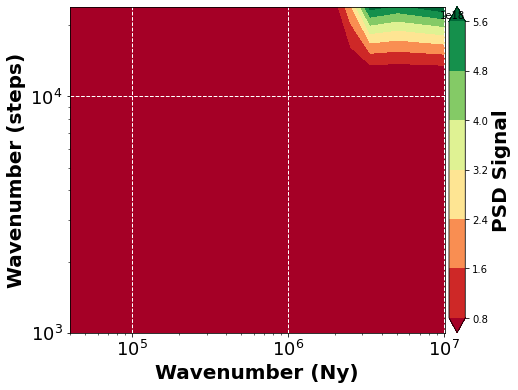

In [122]:
fig, ax = plt.subplots(figsize=(8, 6))

c1 = ax.contourf(
    ds_psd[f"freq_{psd_coords[-1]}"],
    ds_psd[f"freq_{psd_coords[-2]}"],
    ds_psd.psd_signal,
    # levels=np.arange(0,1.1, 0.1),
    cmap='RdYlGn', extend='both'
)
cbar = plt.colorbar(c1, pad=0.01,)
cbar.set_label("PSD Signal", fontsize=20, fontweight="bold")
ax.set_xlabel(f'Wavenumber ({psd_coords[-1]})', fontweight='bold', fontsize=20)
ax.set_ylabel(f'Wavenumber ({psd_coords[-2]})', fontweight='bold', fontsize=20)
plt.xscale('log')
plt.yscale('log')
plt.grid(linestyle='--', lw=1, color='w')
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()

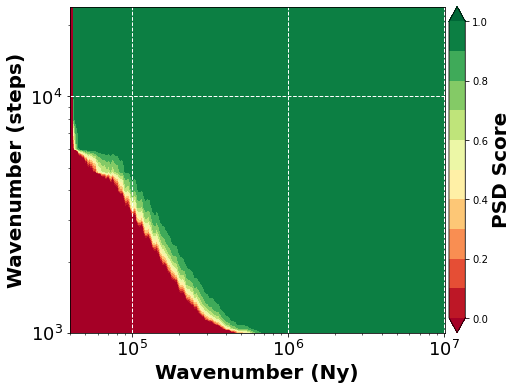

In [123]:
fig, ax = plt.subplots(figsize=(8, 6))

c1 = ax.contourf(
    ds_psd[f"freq_{psd_coords[-1]}"],
    ds_psd[f"freq_{psd_coords[-2]}"],
    ds_psd.psd_score,
    levels=np.arange(0,1.1, 0.1),
    cmap='RdYlGn', extend='both'
)
cbar = plt.colorbar(c1, pad=0.01)
cbar.set_label("PSD Score", fontsize=20, fontweight="bold")
ax.set_xlabel(f'Wavenumber ({psd_coords[-1]})', fontweight='bold', fontsize=20)
ax.set_ylabel(f'Wavenumber ({psd_coords[-2]})', fontweight='bold', fontsize=20)
plt.xscale('log')
plt.yscale('log')
plt.grid(linestyle='--', lw=1, color='w')
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()

### WaveNumber

In [124]:
with ProgressBar():
    
    data = ds_grid.rename({"steps":"time"})
    
    data = data.chunk({'time':1 , "Nx": ds_grid.Nx.size, "Ny": ds_grid.Ny.size})
    
    u = xrft.isotropic_power_spectrum(
        data.u,
        dim=["Nx", "Ny"], detrend='linear', window=True
    ).compute()
    
    v = xrft.isotropic_power_spectrum(
        data.v,
        dim=["Nx", "Ny"], detrend='linear', window=True
    ).compute()
    
    ekeiso = 0.5 * (u**2 + v**2)

[####                                    ] | 10% Completed |  0.1s

/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:47: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(
/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:1025: FutureWarning: Isotropic wavenumber larger than the Nyquist wavenumber may result.
  warnings.warn(msg, FutureWarning)


[########################################] | 100% Completed |  2.1s
[#####                                   ] | 14% Completed |  0.1s

/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:47: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(
/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:1025: FutureWarning: Isotropic wavenumber larger than the Nyquist wavenumber may result.
  warnings.warn(msg, FutureWarning)


[########################################] | 100% Completed |  2.2s


In [125]:
data.v

<xarray.DataArray 'v' (time: 50, Nx: 512, Ny: 512)>
dask.array<rechunk-merge, shape=(50, 512, 512), dtype=float64, chunksize=(1, 512, 512), chunktype=numpy.ndarray>
Coordinates:
  * Nx       (Nx) float64 -5.04e+06 -5.02e+06 -5.001e+06 ... 5.001e+06 5.02e+06
  * Ny       (Ny) float64 -5.04e+06 -5.02e+06 -5.001e+06 ... 5.001e+06 5.02e+06
  * time     (time) float64 0.0 480.0 960.0 ... 2.256e+04 2.304e+04 2.352e+04

In [126]:
# ekeiso

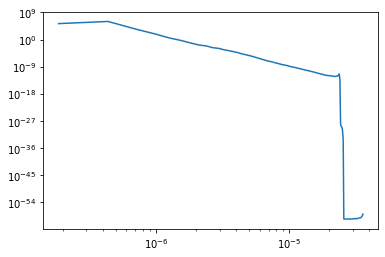

In [127]:
plt.plot(ekeiso.freq_r, ekeiso.mean("time").values)
plt.yscale("log")
plt.xscale("log")

### Powespec

#### DEMO

* [Demo](https://github.com/adekunleoajayi/powerspec/blob/master/notebooks/AJ_2020_05_18_compute_power_spectral_density.ipynb)

### Scale Factors

In [357]:
from typing import NamedTuple

In [365]:
class BoundsLat(NamedTuple):
    min_bound: float
    max_bound: float
    step: float
    
    def mid_bound(self):
        return (self.max_bound - self.min_bound) / 2.0
    
    def coords(self):
        return np.arange(self.min_bound, self.max_bound, self.step)

In [366]:
bds_lat = BoundsLat(32., 44., 1/10)
bds_lat.mid_bound()

6.0

In [367]:
lon_min = 294.                                        # domain min longitude

lon_max = 306.                                        # domain max longitude

lat_min = 32.                                         # domain min latitude

lat_max = 44.                                         # domain max latitude

dx = 1/10                                             # zonal grid spatial step (in degree)

dy = 1/10                                             # meridional grid spatial step (in degree)

In [371]:
lon_coords = np.arange(lon_min, lon_max, dx)
lat_coords = np.arange(lat_min, lat_max, dy)

In [372]:
lon_grid, lat_grid = np.meshgrid(lon_coords, lat_coords)

In [373]:
from pymap3d import geodetic2enu

In [402]:
x, y, z = geodetic2enu(
    lat_grid, lon_grid, 0.0, 
    # (lat_max-lat_min)/2,(lon_max-lon_min)/2, 0.0, 
    0.0, 0.0, 0.0,
    deg=True
)

In [403]:
x.shape, y.shape, z.shape

((120, 120), (120, 120), (120, 120))

In [404]:
x.min(), x.max(), f"{x.max()-x.min():_}"

(-4945988.293846907, -3728773.8080349443, '1_217_214.4858119627')

In [405]:
y.min(), y.max(), z.min(), z.max()

(3360431.434122327, 4400092.205335894, -4505851.841135211, -3203482.922320329)

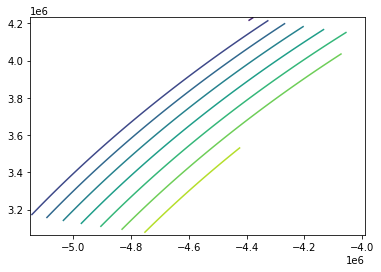

In [389]:
plt.contour(x,y,z)

In [315]:

earthrad = 6371229     # mean earth radius (m)
deg2rad = np.pi / 180.

def lonlat_2_scale(navlon,navlat):
    """Compute scale factors from navlon,navlat.
        """
    lam = navlon
    phi = navlat
    djlam,dilam = np.gradient(lam)
    djphi,diphi = np.gradient(phi)
    e1 = earthrad * deg2rad * np.sqrt( (dilam * np.cos(np.deg2rad(phi)))**2. + diphi**2.)
    e2 = earthrad * deg2rad * np.sqrt( (djlam * np.cos(np.deg2rad(phi)))**2. + djphi**2.)
    
    return e1,e2


def lonlat_2_scale_v2(navlon,navlat):
    """Compute scale factors from navlon,navlat.
        """
    lam = np.deg2rad(navlon)
    phi = np.deg2rad(navlat)
    djlam,dilam = np.gradient(lam)
    djphi,diphi = np.gradient(phi)
    e1 = earthrad * np.sqrt( (dilam * np.cos(phi))**2. + diphi**2.)
    e2 = earthrad * np.sqrt( (djlam * np.cos(phi))**2. + djphi**2.)
    return e1,e2

def scale_2_xy(e1, e2):
    
    x1d_in = e1[0,:].cumsum() - e1[0,0]
    y1d_in = e2[:,0].cumsum() - e2[0,0]
    x2d_in,y2d_in = np.meshgrid(x1d_in,y1d_in)
    return x2d_in, y2d_in 

In [316]:
e1, e2 = lonlat_2_scale(lon_grid, lat_grid)
e1_v2, e2_v2 = lonlat_2_scale_v2(lon_grid, lat_grid)

np.testing.assert_almost_equal(e1, e1_v2)
np.testing.assert_almost_equal(e2, e2_v2)


In [317]:
x_m, y_m = scale_2_xy(e1_v2, e2_v2)

### Sanity Checks

In [323]:
assert x_m.shape == lon_grid.shape

In [330]:
(306-294) * 111_000, 

(1332000, 1320900.0000000189)

In [336]:
x_m.max(), lon_grid.min(), lon_grid.max()

(1122194.2203699343, 294.0, 305.9000000000027)

In [340]:
print(f"{(lon_grid.max() - lon_grid.min()) * 111_000:_}")

1_320_900.0000003004


In [335]:
y_m.max(), lat_grid.min(), lat_grid.max()

(1323267.1890377132, 32.0, 43.90000000000017)

In [338]:
(lat_grid.max()-lat_grid.min()) * 111_130

1322447.0000000189

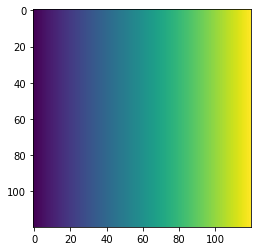

In [321]:
plt.imshow(lon_grid)

In [297]:
e1_v2, e2_v2 = lonlat_2_scale_v2(lon_grid, lat_grid)
x_1d = e1[0,:].cumsum() - e1[0,0]
y_1d = e2[:,0].cumsum() - e2[0,0]

x_2d,y_2d = np.meshgrid(x_1d,y_1d)

In [302]:
x_2d.min(), x_2d.max()

(0.0, 1122194.220369936)

(120,)

In [258]:
e1

array([[9430.20353252, 9430.20353252, 9430.20353252, ..., 9430.20353252,
        9430.20353252, 9430.20353252],
       [9419.90456874, 9419.90456874, 9419.90456874, ..., 9419.90456874,
        9419.90456874, 9419.90456874],
       [9409.57691029, 9409.57691029, 9409.57691029, ..., 9409.57691029,
        9409.57691029, 9409.57691029],
       ...,
       [8039.31683138, 8039.31683138, 8039.31683138, ..., 8039.31683138,
        8039.31683138, 8039.31683138],
       [8025.89603525, 8025.89603525, 8025.89603525, ..., 8025.89603525,
        8025.89603525, 8025.89603525],
       [8012.45079085, 8012.45079085, 8012.45079085, ..., 8012.45079085,
        8012.45079085, 8012.45079085]])

In [282]:
def lonlat2dxdy(lon,lat):
    scale = 111000
    dlon = np.gradient(lon)
    dlat = np.gradient(lat)
    dx = np.sqrt((dlon[1]*scale*np.cos(np.deg2rad(lat)))**2
                 + (dlat[1]*scale)**2)
    dy = np.sqrt((dlon[0]*scale*np.cos(np.deg2rad(lat)))**2
                 + (dlat[0]*scale)**2)
    dx[0,:] = dx[1,:]
    dx[-1,: ]= dx[-2,:] 
    dx[:,0] = dx[:,1]
    dx[:,-1] = dx[:,-2]
    dy[0,:] = dy[1,:]
    dy[-1,:] = dy[-2,:] 
    dy[:,0] = dy[:,1]
    dy[:,-1] = dy[:,-2]
    
    return dx,dy

def lonlat2dxdy_v2(lon,lat):
    scale = 1.0 #111000
    lon = np.deg2rad(lon)
    lat = np.deg2rad(lat)
    dlon = np.gradient(lon)
    dlat = np.gradient(lat)
    dx = np.sqrt((dlon[1]*scale*np.cos(lat))**2
                 + (dlat[1]*scale)**2)
    dy = np.sqrt((dlon[0]*scale*np.cos(lat))**2
                 + (dlat[0]*scale)**2)
    dx[0,:] = dx[1,:]
    dx[-1,: ]= dx[-2,:] 
    dx[:,0] = dx[:,1]
    dx[:,-1] = dx[:,-2]
    dy[0,:] = dy[1,:]
    dy[-1,:] = dy[-2,:] 
    dy[:,0] = dy[:,1]
    dy[:,-1] = dy[:,-2]
    
    return dx,dy

def dxdy2xy(dx,dy,x0=0,y0=0):
    ny,nx = dx.shape
    X = np.zeros((ny,nx))
    Y = np.zeros((ny,nx))
    for i in range(ny):
        for j in range(nx):
            X[i,j] = x0 + np.sum(dx[i,:j])
            Y[i,j] = y0 + np.sum(dy[:i,j])   
    return X,Y

In [283]:
dx

array([[0.08471219, 0.08471219, 0.08471219, ..., 0.08471219, 0.08471219,
        0.08471219],
       [0.08471219, 0.08471219, 0.08471219, ..., 0.08471219, 0.08471219,
        0.08471219],
       [0.08461932, 0.08461932, 0.08461932, ..., 0.08461932, 0.08461932,
        0.08461932],
       ...,
       [0.07229671, 0.07229671, 0.07229671, ..., 0.07229671, 0.07229671,
        0.07229671],
       [0.07217602, 0.07217602, 0.07217602, ..., 0.07217602, 0.07217602,
        0.07217602],
       [0.07217602, 0.07217602, 0.07217602, ..., 0.07217602, 0.07217602,
        0.07217602]])

In [287]:
dx, dy = lonlat2dxdy(lon_grid, lat_grid)
x_, y_ = dxdy2xy(dx, dy)

In [286]:
x.min(), x.max()

(0.0, 1118963.3459539197)

In [277]:
x

array([      0.        ,    9430.20353252,   18860.40706504,
         28290.61059756,   37720.81413008,   47151.0176626 ,
         56581.22119512,   66011.42472764,   75441.62826016,
         84871.83179268,   94302.0353252 ,  103732.23885773,
        113162.44239025,  122592.64592277,  132022.84945529,
        141453.05298781,  150883.25652033,  160313.46005285,
        169743.66358537,  179173.86711789,  188604.07065041,
        198034.27418293,  207464.47771545,  216894.68124797,
        226324.88478049,  235755.08831301,  245185.29184553,
        254615.49537805,  264045.69891057,  273475.90244309,
        282906.10597561,  292336.30950813,  301766.51304066,
        311196.71657318,  320626.9201057 ,  330057.12363822,
        339487.32717074,  348917.53070326,  358347.73423578,
        367777.9377683 ,  377208.14130082,  386638.34483334,
        396068.54836586,  405498.75189838,  414928.9554309 ,
        424359.15896342,  433789.36249594,  443219.56602846,
        452649.76956098,

In [228]:
from datetime import datetime,timedelta

In [194]:
dt_units = timedelta(seconds=480)
dt = dt_units /math.pi

In [196]:
dt_units, dt

(datetime.timedelta(seconds=480),
 datetime.timedelta(seconds=152, microseconds=788745))

In [199]:
from pyproj import Proj
from pyproj import Transformer

In [224]:
trans = Transformer.from_crs(
    crs_from="epsg:4326",
    # crs_from="+proj=latlon",
    crs_to="+proj=utm +zone=10 +ellps=WGS84 +units=m",
    always_xy=True,
)
xx, yy = trans.transform(lat_grid, lon_grid)

In [225]:
xx

array([[6859217.66499129, 6842146.89821459, 6825109.00111171, ...,
        6089831.43760069, 6074136.77983584, 6058467.99311854],
       [6861697.13182732, 6844612.74868857, 6827561.32982516, ...,
        6091760.35177802, 6076055.70254929, 6060376.98613098],
       [6864141.76441645, 6847043.94667129, 6829979.18664613, ...,
        6093661.86630768, 6077947.36216733, 6062258.85181388],
       ...,
       [6937159.54696926, 6919656.05662724, 6902188.49514028, ...,
        6150319.49056069, 6134308.88648942, 6118326.13501787],
       [6937943.46170451, 6920435.56956248, 6902963.63795358, ...,
        6150926.30894995, 6134912.50762654, 6118926.57925608],
       [6938690.37409941, 6921178.28700534, 6903702.19064428, ...,
        6151504.45543767, 6135487.60741649, 6119498.65174869]])

In [226]:
dx

array([[8689.57835716, 8689.57835716, 8689.57835716, ..., 8689.57835716,
        8689.57835715, 8689.57835715],
       [8689.57835716, 8689.57835716, 8689.57835716, ..., 8689.57835716,
        8689.57835715, 8689.57835715],
       [8702.50331759, 8702.50331759, 8702.50331759, ..., 8702.50331759,
        8702.50331759, 8702.50331759],
       ...,
       [9254.95157126, 9254.95157126, 9254.95157126, ..., 9254.95157126,
        9254.95157126, 9254.95157126],
       [9266.56583423, 9266.56583423, 9266.56583423, ..., 9266.56583423,
        9266.56583422, 9266.56583422],
       [9266.56583423, 9266.56583423, 9266.56583423, ..., 9266.56583423,
        9266.56583422, 9266.56583422]])

In [189]:
e1

array([[8692.17524373, 8692.17524373, 8692.17524373, ..., 8692.17524373,
        8692.17524373, 8692.17524373],
       [8705.15097781, 8705.15097781, 8705.15097781, ..., 8705.15097781,
        8705.15097781, 8705.15097781],
       [8718.09910111, 8718.09910111, 8718.09910111, ..., 8718.09910111,
        8718.09910111, 8718.09910111],
       ...,
       [9271.53739903, 9271.53739903, 9271.53739903, ..., 9271.53739903,
        9271.53739903, 9271.53739903],
       [9283.17247595, 9283.17247595, 9283.17247595, ..., 9283.17247595,
        9283.17247595, 9283.17247595],
       [9294.77810874, 9294.77810874, 9294.77810874, ..., 9294.77810874,
        9294.77810874, 9294.77810874]])

In [167]:
e11 = earthrad * np.cos(np.deg2rad(lat_nav)) * np.cos(np.deg2rad(lon_nav)) 
e22 = earthrad * np.cos(np.deg2rad(lat_nav)) * np.sin(np.deg2rad(lon_nav)) 

array([[3738790.65267435, 3733197.50377733, 3727592.51401515, ...,
        3463407.54659586, 3457277.69261233, 3451136.8729194 ],
       [3744371.94296598, 3738770.44458098, 3733157.0876547 , ...,
        3468577.74324808, 3462438.73857982, 3456288.75183248],
       [3749941.35694964, 3744331.52684335, 3738709.82055727, ...,
        3473736.93834966, 3467588.80246822, 3461429.66817284],
       ...,
       [3987993.38386753, 3982027.43314485, 3976048.85232428, ...,
        3694255.08528579, 3687716.656312  , 3681166.53072809],
       [3992998.01339029, 3987024.5758515 , 3981038.49236499, ...,
        3698891.09550065, 3692344.46129392, 3685786.11579871],
       [3997989.97801893, 3992009.07261043, 3986015.50544451, ...,
        3703515.37366258, 3696960.55498736, 3690394.01038246]])

In [164]:
e2

array([[11346.82892332, 11346.82892332, 11346.82892332, ...,
        11346.82892332, 11346.82892332, 11346.82892332],
       [11346.82892332, 11346.82892332, 11346.82892332, ...,
        11346.82892332, 11346.82892332, 11346.82892332],
       [11346.82892332, 11346.82892332, 11346.82892332, ...,
        11346.82892332, 11346.82892332, 11346.82892332],
       ...,
       [11346.82892332, 11346.82892332, 11346.82892332, ...,
        11346.82892332, 11346.82892332, 11346.82892332],
       [11346.82892332, 11346.82892332, 11346.82892332, ...,
        11346.82892332, 11346.82892332, 11346.82892332],
       [11346.82892332, 11346.82892332, 11346.82892332, ...,
        11346.82892332, 11346.82892332, 11346.82892332]])

In [93]:
# ds_test.vozocrtx

In [94]:
from tqdm.notebook import trange

# - compute hourly spectral then estimate the mean
_psd = [] 
for k in trange(len(ds_test.vozocrtx)):
    wavenumber,psd_ = ps.wavenumber_spectra(
        ds_test.vozocrtx[k].to_masked_array().squeeze(),
        ds_test.vozocrtx.nav_lon + 100,
        ds_test.vozocrtx.nav_lat + 100
    )
    _psd.append(psd_) 
psd = np.array(_psd).mean(axis=0)

NameError: name 'ds_test' is not defined

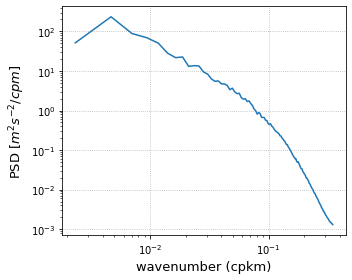

In [138]:
plt.figure(figsize=(5,4))
plt.loglog(wavenumber*1E3,psd)
plt.xlabel('wavenumber (cp space)',fontsize=13)
plt.ylabel('PSD '+r'[speed / cp space]',fontsize=13)
# plt.xlabel('wavenumber (cpkm)',fontsize=13)
# plt.ylabel('PSD '+r'[$m^{2}s^{-2}/cpm$]',fontsize=13)
plt.grid(ls='dotted')
plt.tight_layout()

#### My Data

In [128]:
psd_powerspec_res = {}

In [129]:
from tqdm.notebook import trange

NX, NY = np.meshgrid(ds_grid.p.Nx, ds_grid.p.Ny)
data = ds_grid.p

# - compute hourly spectral then estimate the mean
_psd = [] 
for k in trange(len(data)):
    wavenumber,ipsd = ps.wavenumber_spectra(
        data[k].to_masked_array().squeeze(),
        NX,
        NY
    )
    _psd.append(ipsd) 
    
psd_powerspec_res["psd"] = np.array(_psd)
psd_powerspec_res["wavenumber"] = wavenumber

  0%|          | 0/50 [00:00<?, ?it/s]

`psd_vector = [ time, psd ]`

We need to take the mean for all of the time components...

In [134]:
psd_powerspec_res["psd"].shape

(50, 254)

In [130]:
# take the MEAN wrt to time
psd_powerspec_res["psd_mean"] = psd_powerspec_res["psd"].mean(0)

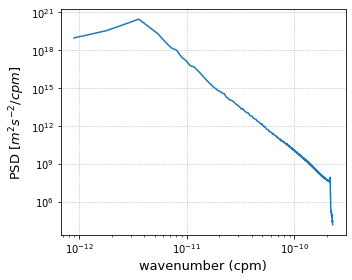

In [131]:
plt.figure(figsize=(5,4))
plt.loglog(
    psd_powerspec_res["wavenumber"] ,#1E3,
    psd_powerspec_res["psd_mean"]
)
plt.xlabel('wavenumber (cp space)',fontsize=13)
plt.ylabel('PSD '+r'[speed / cp space]',fontsize=13)
plt.xlabel('wavenumber (cpm)',fontsize=13)
plt.ylabel('PSD '+r'[$m^{2}s^{-2}/cpm$]',fontsize=13)
plt.grid(ls='dotted')
plt.tight_layout()

## Dataset - Extended Lo Res

In [154]:
save_path = root.joinpath("data/full_res.nc")

In [155]:
ds_grid_ext = xr.open_zarr(save_path)

In [156]:
%%time
ds_grid_ext = ds_grid_ext.isel(
    # steps=slice(500,1000),
    Nx=slice(256,1024-256),
    Ny=slice(256,1024-256)
).compute()

CPU times: user 8.13 s, sys: 7.75 s, total: 15.9 s
Wall time: 33.3 s


In [157]:
%%time
ds_grid_ext = preprocessing(ds_grid_ext)
ds_grid_ext

CPU times: user 4.22 s, sys: 1.27 s, total: 5.49 s
Wall time: 7.85 s


<xarray.Dataset>
Dimensions:  (Nx: 512, Ny: 512, steps: 500)
Coordinates:
  * Nx       (Nx) float64 -3.142 -3.129 -3.117 -3.105 ... 3.105 3.117 3.129
  * Ny       (Ny) float64 -3.142 -3.129 -3.117 -3.105 ... 3.105 3.117 3.129
  * steps    (steps) float64 0.0 1.0 2.0 3.0 4.0 ... 496.0 497.0 498.0 499.0
Data variables:
    p        (steps, Nx, Ny) float64 -0.9737 -0.972 -0.969 ... -0.379 -0.3717
    q        (steps, Nx, Ny) float64 7.771 7.604 7.448 ... -7.913 -7.912 -7.869
    u        (steps, Nx, Ny) float64 1.256 1.245 1.232 ... 0.7007 0.7039 0.7063
    v        (steps, Nx, Ny) float64 0.09456 0.1906 0.2849 ... 0.6022 0.5833
    q_obs    (steps, Nx, Ny) float64 7.761 7.614 7.45 ... -7.92 -7.92 -7.865
    p_obs    (steps, Nx, Ny) float64 -0.9861 -0.9636 -0.9742 ... -0.3823 -0.3754
Attributes: (12/16)
    B:          0.0
    dt:         0.0004
    forcing:    wind_stress
    iters:      10000
    mu:         0.020053522829578813
    nu:         0.00016412040576263483
    ...         ...
    sgs:        constant
    step_size:  0.01227184630308513
    steps:      1000
    t0:         0.0
    x_minmax:   12.566370614359172
    y_minmax:   12.566370614359172

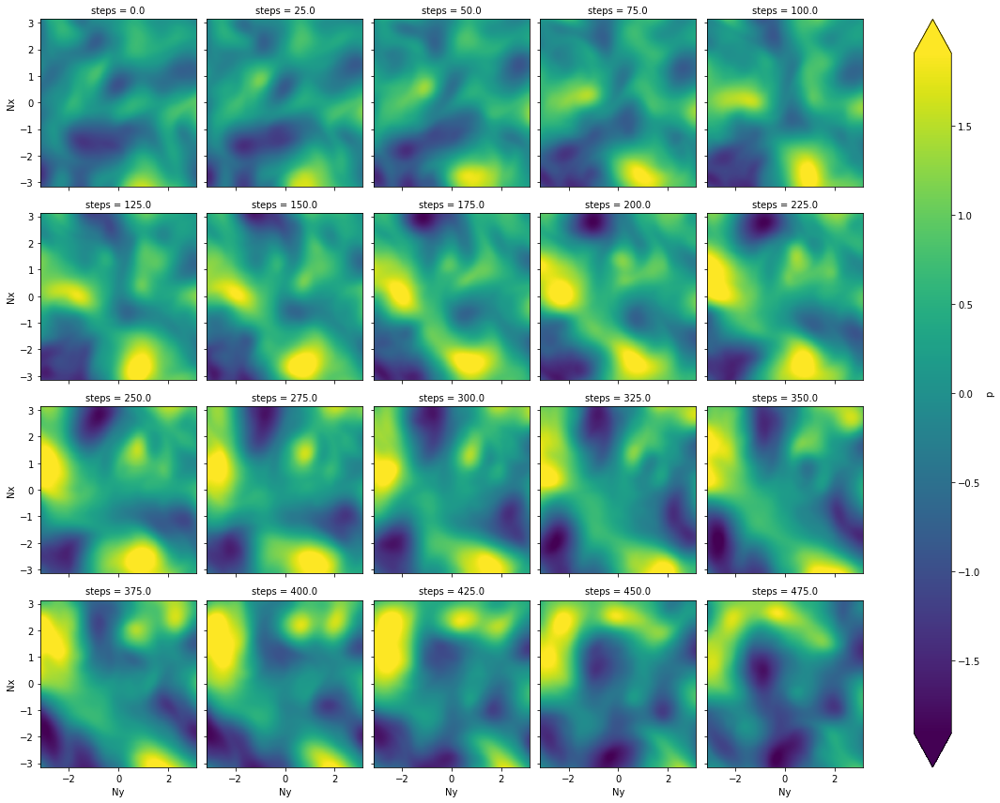

In [158]:
ds_grid_ext.p.thin(steps=25).plot.imshow(
    col="steps", robust=True, col_wrap=5, cmap="viridis",
)


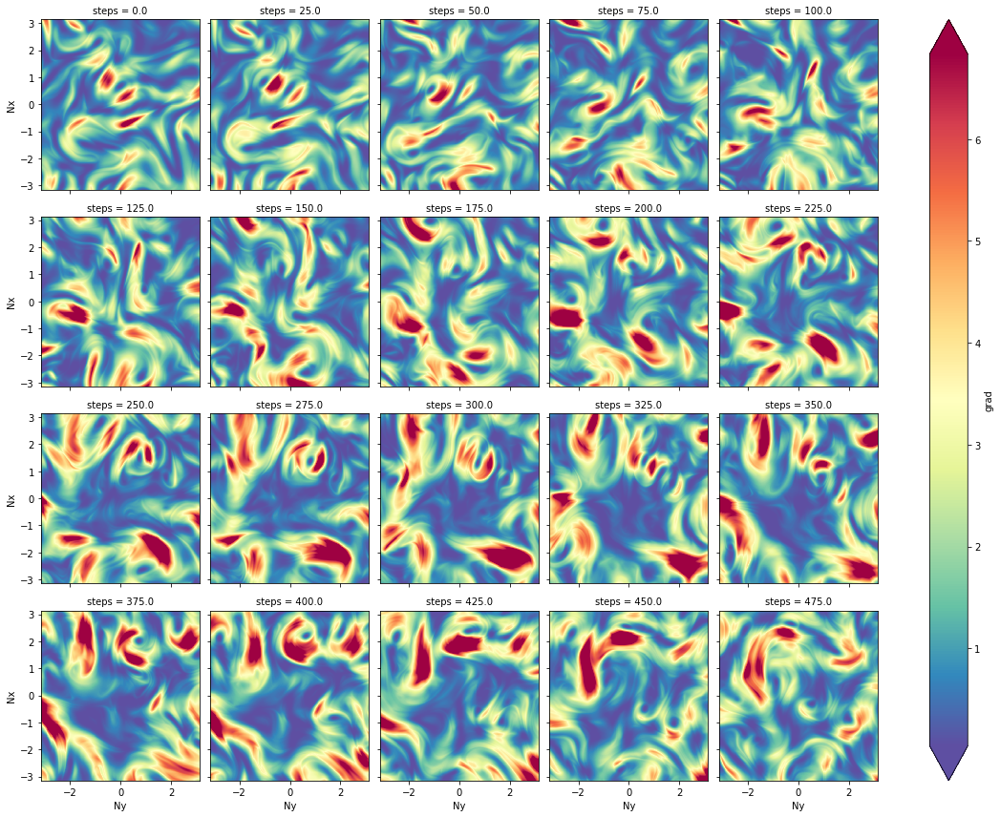

In [159]:
def gradient_norm(ds):
    return (
        ds.differentiate(coord="Nx", edge_order=1)**2 + 
        ds.differentiate(coord="Ny", edge_order=1)**2
    ).rename("grad")

ds_grid_ext.p.pipe(gradient_norm).thin(steps=25).plot.imshow(
    col="steps", robust=True, col_wrap=5, cmap="Spectral_r",
)

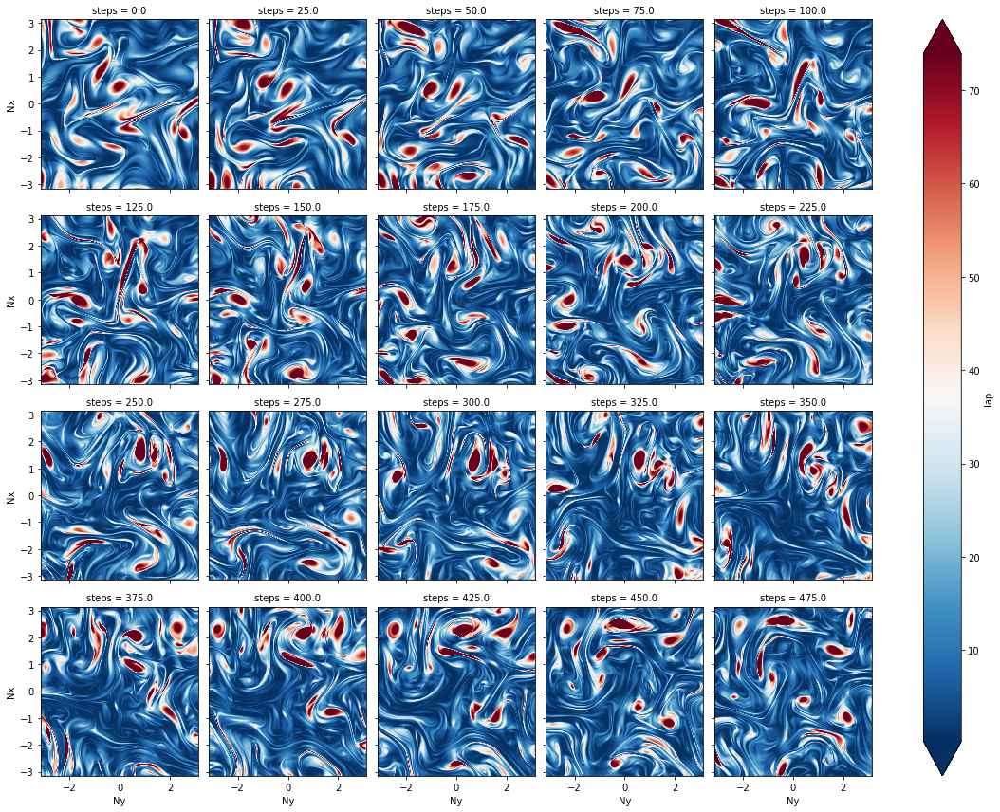

In [160]:
def laplacian_norm(ds):
    return (
        ds.differentiate(coord="Nx", edge_order=1).differentiate(coord="Nx", edge_order=1)**2 + 
        ds.differentiate(coord="Ny", edge_order=1).differentiate(coord="Ny", edge_order=1)**2
    ).rename("lap")

ds_grid_ext.p.pipe(laplacian_norm).thin(steps=25).plot.imshow(
    col="steps", robust=True, col_wrap=5, cmap="RdBu_r"
)


In [161]:
# ds_grid_ext.p_obs.hvplot.image(x="Nx", y="Ny", width=500, height=400, cmap="RdBu_r")
# 

In [162]:
psd_coords = ["Nx", "steps", "Ny"]
# psd_coords = ["Ny", "steps", "Nx"]

ds_psd_ext = compute_psd(ds_grid_ext.p, ds_grid_ext.p_obs, psd_coords)

[                                        ] | 0% Completed |  0.5s

/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:47: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(
/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:47: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(


[########################################] | 100% Completed |  3.7s
[########################################] | 100% Completed |  3.1s


In [163]:
ds_psd_ext.coords[f"freq_{psd_coords[-2]}"] = 1./ ds_psd_ext[f"freq_{psd_coords[-2]}"]
ds_psd_ext.coords[f"freq_{psd_coords[-1]}"] = 1./ds_psd_ext[f"freq_{psd_coords[-1]}"]



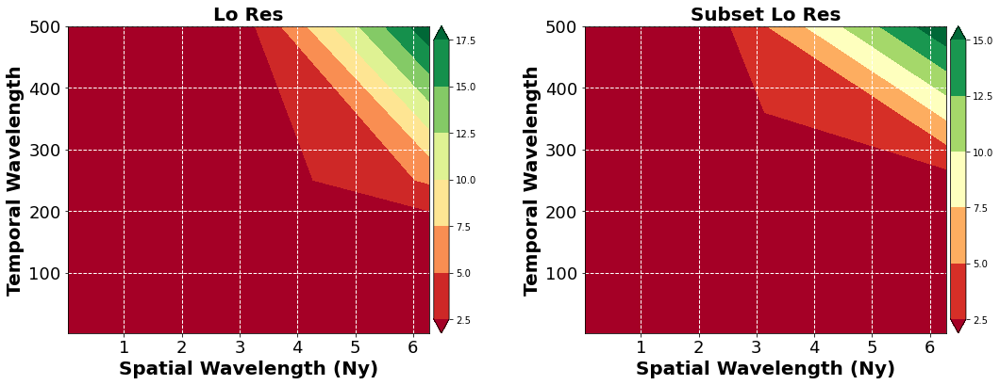

In [205]:
fig, ax = plt.subplots(figsize=(18, 6), ncols=2)

c1 = ax[0].contourf(
    ds_psd[f"freq_{psd_coords[-1]}"],
    ds_psd[f"freq_{psd_coords[-2]}"],
    ds_psd.psd_signal,
    # levels=np.arange(0,1.1, 0.1),
    cmap='RdYlGn', extend='both'
)
cbar = plt.colorbar(c1, ax=ax[0], pad=0.01)
ax[0].set_xlabel(f'Spatial Wavelength ({psd_coords[-1]})', fontweight='bold', fontsize=20)
ax[0].set_ylabel('Temporal Wavelength', fontweight='bold', fontsize=20)
ax[0].grid(linestyle='--', lw=1, color='w')
ax[0].tick_params(axis='both', which='major', labelsize=18)
ax[0].set_title("Lo Res", fontsize=20, fontweight="bold")

c1 = ax[1].contourf(
    ds_psd_ext[f"freq_{psd_coords[-1]}"],
    ds_psd_ext[f"freq_{psd_coords[-2]}"],
    ds_psd_ext.psd_signal,
    # levels=np.arange(0,1.1, 0.1),
    cmap='RdYlGn', extend='both'
)
cbar = plt.colorbar(c1, ax=ax[1], pad=0.01)
ax[1].set_xlabel(f'Spatial Wavelength ({psd_coords[-1]})', fontweight='bold', fontsize=20)
ax[1].set_ylabel('Temporal Wavelength', fontweight='bold', fontsize=20)
ax[1].grid(linestyle='--', lw=1, color='w')
ax[1].tick_params(axis='both', which='major', labelsize=18)
ax[1].set_title("Subset Lo Res", fontsize=20, fontweight="bold")

plt.show()

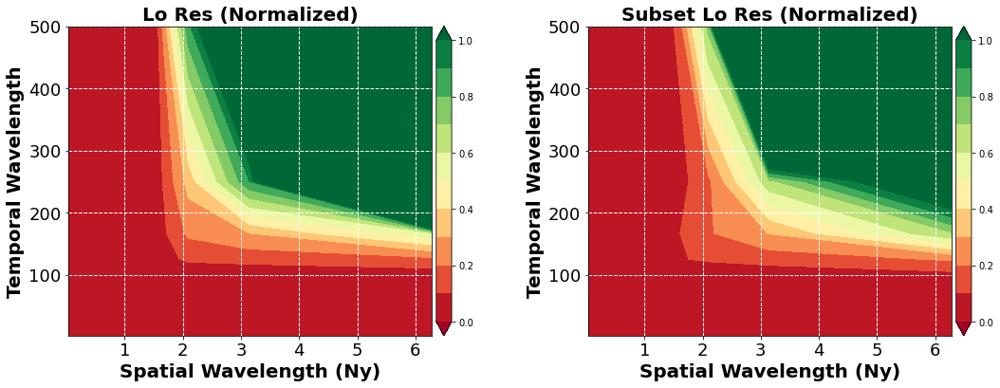

In [206]:
fig, ax = plt.subplots(figsize=(18, 6), ncols=2)

c1 = ax[0].contourf(
    ds_psd[f"freq_{psd_coords[-1]}"],
    ds_psd[f"freq_{psd_coords[-2]}"],
    ds_psd.psd_signal,
    levels=np.arange(0,1.1, 0.1),
    cmap='RdYlGn', extend='both'
)
cbar = plt.colorbar(c1, ax=ax[0], pad=0.01)
ax[0].set_xlabel(f'Spatial Wavelength ({psd_coords[-1]})', fontweight='bold', fontsize=20)
ax[0].set_ylabel('Temporal Wavelength', fontweight='bold', fontsize=20)
ax[0].grid(linestyle='--', lw=1, color='w')
ax[0].tick_params(axis='both', which='major', labelsize=18)
ax[0].set_title("Lo Res (Normalized)", fontsize=20, fontweight="bold")

c1 = ax[1].contourf(
    ds_psd_ext[f"freq_{psd_coords[-1]}"],
    ds_psd_ext[f"freq_{psd_coords[-2]}"],
    ds_psd_ext.psd_signal,
    levels=np.arange(0,1.1, 0.1),
    cmap='RdYlGn', extend='both'
)
cbar = plt.colorbar(c1, ax=ax[1], pad=0.01)
ax[1].set_xlabel(f'Spatial Wavelength ({psd_coords[-1]})', fontweight='bold', fontsize=20)
ax[1].set_ylabel('Temporal Wavelength', fontweight='bold', fontsize=20)
ax[1].grid(linestyle='--', lw=1, color='w')
ax[1].tick_params(axis='both', which='major', labelsize=18)
ax[1].set_title("Subset Lo Res (Normalized)", fontsize=20, fontweight="bold")

plt.show()

In [165]:
# ds_test = xr.open_dataset("https://github.com/adekunleoajayi/powerspec/raw/9f9ea5b1044fca2591c33f53838fee097e53e023/data/eNATL60SBOX-BLBT02_y2010m03d01.1h_vozocrtx_lev0.nc")

In [89]:


# # - get data
# ds_path = '/Users/eman/code_projects/2022b_qg_mapping/data/eNATL60SBOX-BLBT02_y2010m03d01.1h_vozocrtx_lev0.nc'
# ds_test = xr.open_dataset(ds_path)
# ds_test



<xarray.Dataset>
Dimensions:              (depthu: 1, axis_nbounds: 2, y: 398, x: 298,
                          time_counter: 24)
Coordinates:
  * depthu               (depthu) float32 0.4805
    nav_lat              (y, x) float32 ...
    nav_lon              (y, x) float32 ...
    time_centered        (time_counter) datetime64[ns] ...
  * time_counter         (time_counter) datetime64[ns] 2010-03-01T00:30:00 .....
Dimensions without coordinates: axis_nbounds, y, x
Data variables:
    depthu_bounds        (depthu, axis_nbounds) float32 ...
    time_counter_bounds  (time_counter, axis_nbounds) datetime64[ns] ...
    vozocrtx             (time_counter, depthu, y, x) float32 ...
Attributes: (12/14)
    name:         /scratch/tmp/5330499/eNATL60-BLBT02X_1h_20100220_20100316_g...
    description:  ocean U grid variables
    title:        ocean U grid variables
    Conventions:  CF-1.6
    timeStamp:    2019-Apr-03 05:55:55 GMT
    uuid:         0bff26d2-426e-492d-81f5-d8c6cfcefc60
    ...           ...
    jbegin:       0
    nj:           10
    file_name:    eNATL60-BLBT02X_1h_20100220_20100316_gridU_20100301-2010030...
    TimeStamp:    04/04/2019 04:29:10 +0200
    history:      Tue Apr 21 15:41:04 2020: ncks -O -F -d x,3479,3776 -d y,22...
    NCO:          4.4.6

In [98]:
ds_test.vozocrtx

<xarray.DataArray 'vozocrtx' (time_counter: 24, depthu: 1, y: 398, x: 298)>
[2846496 values with dtype=float32]
Coordinates:
  * depthu         (depthu) float32 0.4805
    nav_lat        (y, x) float32 ...
    nav_lon        (y, x) float32 ...
    time_centered  (time_counter) datetime64[ns] 2010-03-01T00:30:00 ... 2010...
  * time_counter   (time_counter) datetime64[ns] 2010-03-01T00:30:00 ... 2010...
Dimensions without coordinates: y, x
Attributes:
    standard_name:       sea_water_x_velocity
    long_name:           ocean current along i-axis
    units:               m/s
    online_operation:    average
    interval_operation:  40 s
    interval_write:      1 h
    cell_methods:        time: mean (interval: 40 s)

In [107]:
data

<xarray.DataArray 'vozocrtx' (time_counter: 24, y: 398, x: 298)>
[2846496 values with dtype=float32]
Coordinates:
    depthu         float32 0.4805
    nav_lat        (y, x) float32 ...
    nav_lon        (y, x) float32 ...
    time_centered  (time_counter) datetime64[ns] 2010-03-01T00:30:00 ... 2010...
  * time_counter   (time_counter) datetime64[ns] 2010-03-01T00:30:00 ... 2010...
Dimensions without coordinates: y, x
Attributes:
    standard_name:       sea_water_x_velocity
    long_name:           ocean current along i-axis
    units:               m/s
    online_operation:    average
    interval_operation:  40 s
    interval_write:      1 h
    cell_methods:        time: mean (interval: 40 s)

In [200]:
# with ProgressBar():
    
#     data = ds_test.isel(depthu=0).vozocrtx

#     data = data.chunk({'time_counter':100 , "nav_lon": data.nav_lon.size, "nav_lat": data.nav_lat.size})
    
#     u = xrft.isotropic_power_spectrum(
#         data,
#         dim=["nav_lon", "nav_lat"], detrend='linear', window=True
#     ).compute()
    
#     # v = xrft.isotropic_power_spectrum(
#     #     data.v,
#     #     dim=["nav_lon", "nav_lat"], detrend='linear', window=True
#     # ).compute()
    
#     # ekeiso_ext = 0.5 * (u**2 + v**2)

### PowerSpec

In [175]:
from tqdm.notebook import trange

NX, NY = np.meshgrid(ds_grid_ext.p.Nx, ds_grid_ext.p.Ny)
data = ds_grid_ext.p

# - compute hourly spectral then estimate the mean
_psd = [] 
for k in trange(len(data)):
    wavenumber, ipsd = ps.wavenumber_spectra(
        data[k].to_masked_array().squeeze(),
        NX,
        NY
    )
    _psd.append(ipsd) 
    
psd_powerspec_res["psd_full"] = np.array(_psd)
psd_powerspec_res["wavenumber_full"] = wavenumber

  0%|          | 0/500 [00:00<?, ?it/s]

In [176]:
psd_powerspec_res["psd_full_mean"] = psd_powerspec_res["psd_full"].mean(0)

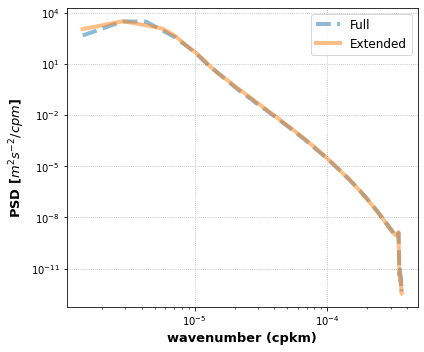

In [192]:
fig, ax = plt.subplots(figsize=(6,5))
ax.loglog(
    psd_powerspec_res["wavenumber_full"],#1E3,
    psd_powerspec_res["psd_full_mean"],
    label="Full", linewidth=4, linestyle="--", alpha=0.5
)
ax.loglog(
    psd_powerspec_res["wavenumber"],#1E3,
    psd_powerspec_res["psd_mean"],
    label="Extended", linewidth=4, alpha=0.5
)
ax.set_xlabel('wavenumber (cpkm)',fontsize=13, fontweight="bold")
ax.set_ylabel('PSD '+r'[$m^{2}s^{-2}/cpm$]',fontsize=13, fontweight="bold")

plt.legend(fontsize=12)
plt.grid(ls='dotted')
plt.tight_layout()
plt.show()

In [51]:
with ProgressBar():
    
    data = ds_grid_ext.rename({"steps":"time"})
    
    data = data.chunk({'time':100 , "Nx": ds_grid.Nx.size, "Ny": ds_grid.Ny.size})
    
    u = xrft.isotropic_power_spectrum(
        data.u,
        dim=["Nx", "Ny"], detrend='linear', window=True
    ).compute()
    
    v = xrft.isotropic_power_spectrum(
        data.v,
        dim=["Nx", "Ny"], detrend='linear', window=True
    ).compute()
    
    ekeiso_ext = 0.5 * (u**2 + v**2)

[                                        ] | 0% Completed |  0.0s

/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:47: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(
/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:1025: FutureWarning: Isotropic wavenumber larger than the Nyquist wavenumber may result.
  warnings.warn(msg, FutureWarning)


[########################################] | 100% Completed | 14.4s
[                                        ] | 2% Completed |  0.1s

/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:47: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(
/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:1025: FutureWarning: Isotropic wavenumber larger than the Nyquist wavenumber may result.
  warnings.warn(msg, FutureWarning)


[########################################] | 100% Completed | 14.3s


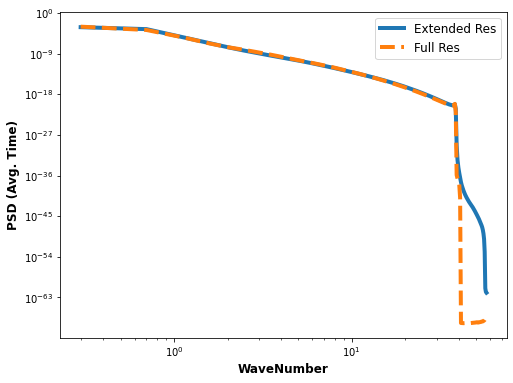

In [195]:
fig, ax = plt.subplots(figsize=(8,6))

ax.plot(
    ekeiso_ext.freq_r, ekeiso_ext.mean("time").values, 
    linewidth=4, label="Extended Res")
ax.plot(
    ekeiso.freq_r, ekeiso.mean("time").values, 
    linewidth=4, linestyle="--", label="Full Res")
ax.set_yscale("log")
ax.set_xscale("log")
plt.legend(fontsize=12)
ax.set_xlabel("WaveNumber", fontsize=12, fontweight="bold")
ax.set_ylabel("PSD (Avg. Time)", fontsize=12, fontweight="bold")
plt.show()

## Dataset - Difference

In [44]:
ds_grid["p_ext"] = (("steps","Nx","Ny"), ds_grid_ext["p"].values)
ds_grid["q_ext"] = (("steps","Nx","Ny"), ds_grid_ext["q"].values)

In [45]:
psd_coords = ["Ny", "steps", "Nx"]

ds_psd_compare = compute_psd(ds_grid.p, ds_grid.p_ext, psd_coords)

/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:47: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(
/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:47: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(


[########################################] | 100% Completed |  6.8s
[########################################] | 100% Completed |  7.1s


In [46]:
ds_psd_compare.coords[f"freq_{psd_coords[-2]}"] = 1./ ds_psd_compare[f"freq_{psd_coords[-2]}"]

ds_psd_compare.coords[f"freq_{psd_coords[-1]}"] = 1./ds_psd_compare[f"freq_{psd_coords[-1]}"]



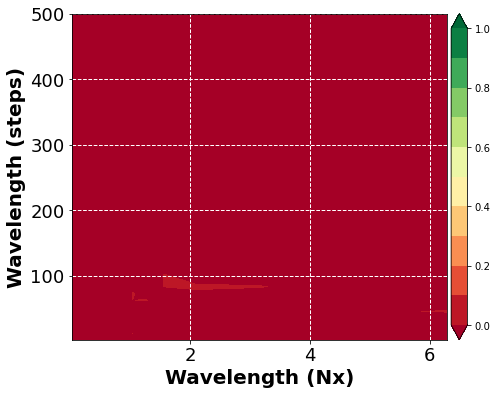

In [47]:
fig, ax = plt.subplots(figsize=(8, 6))

c1 = ax.contourf(
    ds_psd_compare[f"freq_{psd_coords[-1]}"],
    ds_psd_compare[f"freq_{psd_coords[-2]}"],
    ds_psd_compare.psd_score,
    levels=np.arange(0,1.1, 0.1),
    cmap='RdYlGn', extend='both'
)
cbar = plt.colorbar(c1, pad=0.01)

ax.set_xlabel(f'Wavelength ({psd_coords[-1]})', fontweight='bold', fontsize=20)
ax.set_ylabel(f'Wavelength ({psd_coords[-2]})', fontweight='bold', fontsize=20)
ax.grid(linestyle='--', lw=1, color='w')
ax.tick_params(axis='both', which='major', labelsize=18)

plt.show()

## Dataset - Higher Res

In [38]:
save_path = root.joinpath("data/hi_res.nc")

ds_grid = xr.open_zarr(save_path)

In [41]:
ds_grid

,Array,Chunk
Bytes,3.91 GiB,3.94 MiB
Shape,"(500, 1024, 1024)","(63, 64, 128)"
Count,3201 Tasks,1152 Chunks
Type,float64,numpy.ndarray
,Array,Chunk
Bytes,3.91 GiB,3.94 MiB
Shape,"(500, 1024, 1024)","(63, 64, 128)"
Count,3201 Tasks,1152 Chunks
Type,float64,numpy.ndarray
,Array,Chunk


In [39]:
%%time

ds_grid = preprocessing(ds_grid)

In [42]:
# ds_grid.p_obs.hvplot.image(x="Nx", y="Ny", width=500, height=400, cmap="RdBu_r")

In [44]:
psd_coords = ["Nx", "steps", "Ny"]
# psd_coords = ["Ny", "steps", "Nx"]

ds_psd_hi = compute_psd(ds_grid.p, ds_grid.p_obs, psd_coords)

/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:47: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(


[########################################] | 100% Completed | 15.9s


/Users/eman/miniconda3/envs/torch_py39/lib/python3.9/site-packages/xrft/xrft.py:47: FutureWarning: Please provide the name of window adhering to scipy.signal.windows. The boolean option will be deprecated in future releases.
  warnings.warn(


[########################################] | 100% Completed | 10.1s


In [45]:
ds_psd_hi.coords[f"freq_{psd_coords[-2]}"] = 1./ ds_psd_hi[f"freq_{psd_coords[-2]}"]
ds_psd_hi.coords[f"freq_{psd_coords[-1]}"] = 1./ds_psd_hi[f"freq_{psd_coords[-1]}"]

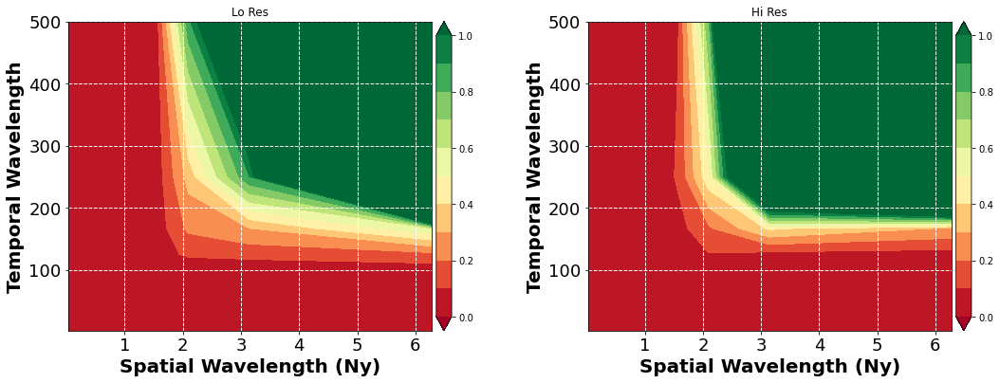

In [65]:
fig, ax = plt.subplots(figsize=(18, 6), ncols=2)

c1 = ax[0].contourf(
    ds_psd[f"freq_{psd_coords[-1]}"],
    ds_psd[f"freq_{psd_coords[-2]}"],
    ds_psd.psd_signal,
    levels=np.arange(0,1.1, 0.1),
    cmap='RdYlGn', extend='both'
)
cbar = plt.colorbar(c1, ax=ax[0], pad=0.01)
ax[0].set_xlabel(f'Spatial Wavelength ({psd_coords[-1]})', fontweight='bold', fontsize=20)
ax[0].set_ylabel('Temporal Wavelength', fontweight='bold', fontsize=20)
ax[0].grid(linestyle='--', lw=1, color='w')
ax[0].tick_params(axis='both', which='major', labelsize=18)
ax[0].set_title("Lo Res")

c1 = ax[1].contourf(
    ds_psd_hi[f"freq_{psd_coords[-1]}"],
    ds_psd_hi[f"freq_{psd_coords[-2]}"],
    ds_psd_hi.psd_signal,
    levels=np.arange(0,1.1, 0.1),
    cmap='RdYlGn', extend='both'
)
cbar = plt.colorbar(c1, ax=ax[1], pad=0.01)
ax[1].set_xlabel(f'Spatial Wavelength ({psd_coords[-1]})', fontweight='bold', fontsize=20)
ax[1].set_ylabel('Temporal Wavelength', fontweight='bold', fontsize=20)
ax[1].grid(linestyle='--', lw=1, color='w')
ax[1].tick_params(axis='both', which='major', labelsize=18)
ax[1].set_title("Hi Res")

plt.show()